In [1]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=RuntimeWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

from datetime import date
import hisepy
import numpy as np
import os
import pandas as pd
import re
import scanpy as sc

In [2]:
out_dir = 'output'
if not os.path.isdir(out_dir):
    os.makedirs(out_dir)

In [3]:
out_files = []
update_list = []

## Helper functions

In [4]:
def cache_uuid_path(uuid):
    cache_path = '/home/jupyter/cache/{u}'.format(u = uuid)
    if not os.path.isdir(cache_path):
        hise_res = hisepy.reader.cache_files([uuid])
    filename = os.listdir(cache_path)[0]
    cache_file = '{p}/{f}'.format(p = cache_path, f = filename)
    return cache_file

In [5]:
def read_csv_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = pd.read_csv(cache_file)
    return res

In [6]:
def read_parquet_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = pd.read_parquet(cache_file)
    return res

In [7]:
def read_adata_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = sc.read_h5ad(cache_file)
    return res

In [8]:
def backed_adata_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = sc.read_h5ad(cache_file, backed = 'r')
    return res

In [9]:
def rm_cache_uuid(uuid):
    cache_path = '/home/jupyter/cache/{u}'.format(u = uuid)
    rm_call = 'rm -r {d}'.format(d = cache_path)
    os.system(rm_call)

In [10]:
def format_cell_type(cell_type):
    cell_type = re.sub('\\+', 'pos', cell_type)
    cell_type = re.sub('-', 'neg', cell_type)
    cell_type = re.sub(' ', '_', cell_type)
    return cell_type

In [11]:
def filename_cell_type(filename):
    cell_type = re.sub('.+L3_','',filename)
    cell_type = re.sub('_2024.+','',cell_type)
    cell_type = re.sub('_', ' ', cell_type)
    cell_type = re.sub('pos','+', cell_type)
    cell_type = re.sub('neg','-', cell_type)
    return cell_type

In [12]:
def add_labels(adata, labels):
    obs = adata.obs
    obs = obs.reset_index(drop = True)
    obs = obs.merge(labels, on = 'barcodes', how = 'left')
    obs = obs.set_index('barcodes', drop = False)
    adata.obs = obs
    return adata

In [13]:
def propagate_hierarchy(
    adata,
    hierarchy_df,
    from_level = 'AIFI_L3',
    to_levels = ['AIFI_L2', 'AIFI_L1'],
    keep_original = True,
    original_prefix = 'predicted_'
):
    obs = adata.obs
    
    for to_level in to_levels:
        prop_df = hierarchy_df[[from_level, to_level]]
        prop_df = prop_df.drop_duplicates()
        
        if keep_original:
            obs = obs.rename({to_level: original_prefix + to_level}, axis = 1)
        else:
            obs = obs.drop(to_level, axis = 1)

        obs[from_level] = obs[from_level].astype(str)
        obs = obs.merge(prop_df, on = from_level, how = 'left')
        obs[from_level] = obs[from_level].astype('category')
        obs[to_level] = obs[to_level].astype('category')
        
    obs = obs.set_index('barcodes', drop = False)
    adata.obs = obs

    return adata

In [14]:
def element_id(n = 3):
    import periodictable
    from random import randrange
    rand_el = []
    for i in range(n):
        el = randrange(0,118)
        rand_el.append(periodictable.elements[el].name)
    rand_str = '-'.join(rand_el)
    return rand_str

## Cluster selection functions

In [15]:
def marker_frac_df(adata, markers, clusters = 'louvain_2'):
    gene_cl_frac = sc.pl.dotplot(
        adata, 
        groupby = clusters,
        var_names = markers,
        return_fig = True
    ).dot_size_df
    return gene_cl_frac

def select_clusters_above_gene_frac(adata, gene, cutoff, clusters = 'louvain_2'):
    gene_cl_frac = marker_frac_df(adata, gene, clusters)
    select_cl = gene_cl_frac.index[gene_cl_frac[gene] > cutoff].tolist()

    return select_cl

def select_clusters_below_gene_frac(adata, gene, cutoff, clusters = 'louvain_2'):
    gene_cl_frac = marker_frac_df(adata, gene, clusters)
    select_cl = gene_cl_frac.index[gene_cl_frac[gene] < cutoff].tolist()

    return select_cl

In [54]:
def extract_cl(adata, gene, direction, cutoff, clusters):
    if direction == 'above':
        sel_cl = select_clusters_above_gene_frac(
            adata, gene, cutoff, clusters
        )
    else:
        sel_cl = select_clusters_below_gene_frac(
            adata, gene, cutoff, clusters
        )
    print(sel_cl)
    sel_idx = adata.obs[clusters].isin(sel_cl)
    n_extracted = sum(sel_idx)
    
    sel_adata = adata[sel_idx]
    
    return sel_adata, n_extracted

In [55]:
def remove_cl(adata, gene, direction, cutoff, clusters):
    if direction == 'above':
        sel_cl = select_clusters_above_gene_frac(
            adata, gene, cutoff, clusters
        )
    else:
        sel_cl = select_clusters_below_gene_frac(
            adata, gene, cutoff, clusters
        )
    print(sel_cl)
    remove_idx = adata.obs[clusters].isin(sel_cl)
    n_removed = sum(remove_idx)
    keep_idx = [not x for x in remove_idx]

    adata = adata[keep_idx]
    
    return adata, n_removed

## Processing function

In [18]:
def process_adata(adata, resolution = 2):
    
    # Keep a copy of the raw data
    adata = adata.raw.to_adata()
    adata.raw = adata

    print('Normalizing', end = "; ")
    # Normalize and log transform
    sc.pp.normalize_total(adata)
    sc.pp.log1p(adata)

    print('Finding HVGs', end = "; ")
    # Restrict downstream steps to variable genes
    sc.pp.highly_variable_genes(adata)
    adata = adata[:, adata.var_names[adata.var['highly_variable']]].copy()

    print('Scaling', end = "; ")
    # Scale variable genes
    sc.pp.scale(adata)

    print('PCA', end = "; ")
    # Run PCA
    sc.tl.pca(adata, svd_solver = 'arpack')
    
    print('Neighbors', end = "; ")
    # Find nearest neighbors
    sc.pp.neighbors(
        adata, 
        n_neighbors = 50,
        n_pcs = 30
    )

    print('Leiden', end = "; ")
    # Find clusters
    sc.tl.leiden(
        adata, 
        resolution = resolution, 
        key_added = 'leiden_{r}'.format(r = resolution),
        n_iterations = 2
    )

    print('UMAP', end = "; ")
    # Run UMAP
    sc.tl.umap(adata, min_dist = 0.05)
    
    print('Renormalizing')
    adata = adata.raw.to_adata()
    adata.raw = adata

    # Normalize and log transform
    sc.pp.normalize_total(adata)
    sc.pp.log1p(adata)
    
    return adata

## Markers for dotplots

In [19]:
broad_markers = [
    'CD3D', # T cells
    'CD3E', # T cells/NK
    'FCN1', # Monocytes/Myeloid
    'HBB', # Erythrocytes
    'MS4A1', # B cells
    'CD79A', # B cells
    'PPBP', # Platelets
    'IFI44L' # ISG-high
]

In [20]:
class_markers = [
    'CD4',
    'CD8A',
    'CD27',
    'GZMB',
    'GZMK',
    'IFI44L',
    'IKZF2',
    'KLRB1',
    'KLRF1',
    'SOX4',
    'TRAC',
    'TRDC',
    'TRDV1',
    'TRDV2'
]

## Read cell type hierarchy

In [21]:
hierarchy_uuid = '1a44252c-8cab-4c8f-92c9-d8f3af633790'
hierarchy_df = read_csv_uuid(hierarchy_uuid)

## Identify files for use in HISE

In [22]:
search_id = 'darmstadtium-francium-dubnium'

Retrieve files stored in our HISE project store

In [23]:
ps_df = hisepy.list_files_in_project_store('cohorts')
ps_df = ps_df[['id', 'name']]

Filter for files from the previous notebook using our search_id

In [24]:
search_df = ps_df[ps_df['name'].str.contains(search_id)]
search_df = search_df.sort_values('name')
search_df['AIFI_L3'] = [filename_cell_type(f) for f in search_df['name']]

In [25]:
search_df['AIFI_L3'].tolist()

['CD4 MAIT',
 'CD8 MAIT',
 'DN T cell',
 'GZMB+ Vd2 gdT',
 'GZMK+ Vd2 gdT',
 'GZMK+ memory CD4 Treg',
 'HBB+ MAIT',
 'ISG+ MAIT',
 'KLRB1+ memory CD4 Treg',
 'KLRB1+ memory CD8 Treg',
 'KLRF1- effector Vd1 gdT',
 'KLRF1+ effector Vd1 gdT',
 'Memory CD4 Treg',
 'Memory CD8 Treg',
 'Naive CD4 Treg',
 'Naive Vd1 gdT',
 'Proliferating T cell',
 'SOX4+ Vd1 gdT']

# Updated Filtering

## Filter CD4 MAIT

### Proposed updates

- Remove High doublet score clusters as doublets

In [26]:
cell_type = 'CD4 MAIT'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [27]:
type_uuid

'7a707d33-c302-43a4-bfb2-17b178e72b1b'

In [28]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [29]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

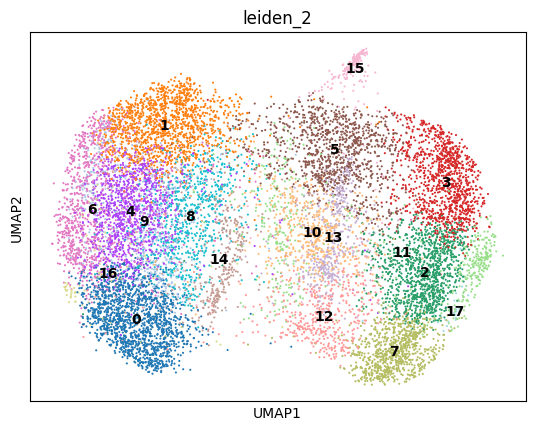

In [30]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

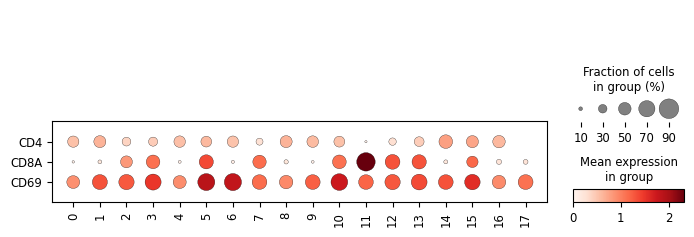

In [31]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['CD4','CD8A','CD69'], swap_axes = True)

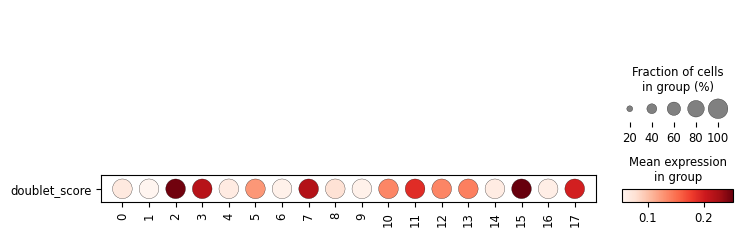

In [32]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['doublet_score'], swap_axes = True)

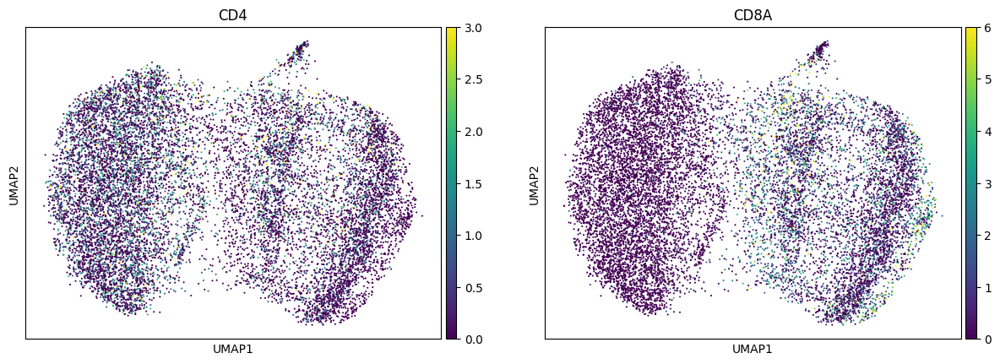

In [33]:
sc.pl.umap(adata, color = ['CD4', 'CD8A'], vmax = 'p99')

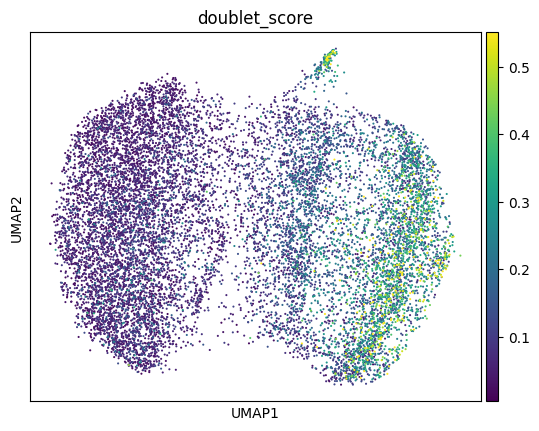

In [34]:
sc.pl.umap(adata, color = ['doublet_score'], vmax = 'p99')

### High doublet score selection

In [35]:
cl_mean_doublet_score = sc.pl.dotplot(
        adata, groupby = 'leiden_2',
        var_names = 'doublet_score',
        return_fig = True
    ).dot_color_df
select_cl = cl_mean_doublet_score.index[cl_mean_doublet_score['doublet_score'] > 0.1].tolist()

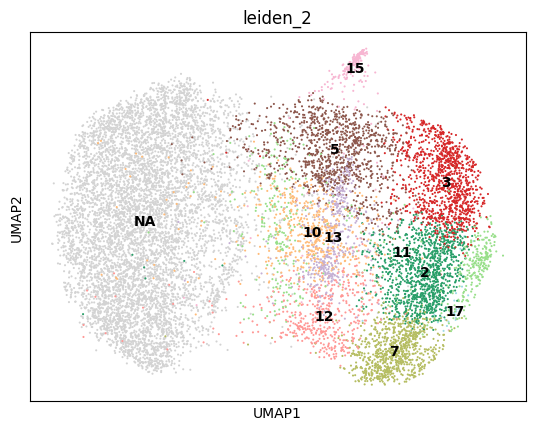

In [36]:
sc.pl.umap(adata, color = 'leiden_2', groups = select_cl, legend_loc = 'on data')

### High doublet score filtering

In [37]:
remove_idx = adata.obs['leiden_2'].isin(select_cl)
n_removed = sum(remove_idx)
keep_idx = [not x for x in remove_idx]
adata = adata[keep_idx]

### High doublet score reason

In [38]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['reassign'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['Doublets']
    }
)
update_list.append(update_df)

### Reprocess filtered cells

In [39]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


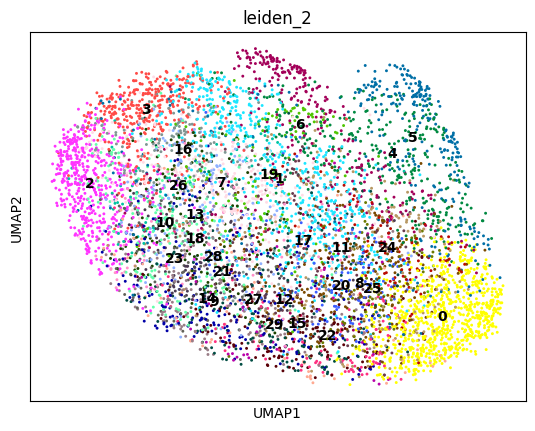

In [40]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Save filtered cells

In [41]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Filter CD8 MAIT

### Proposed updates

- Remove GZMH-high clusters as mislabeled

In [42]:
cell_type = 'CD8 MAIT'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [43]:
type_uuid

'c73bbbec-9383-41e3-8aff-b65f64e56cb5'

In [44]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [45]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

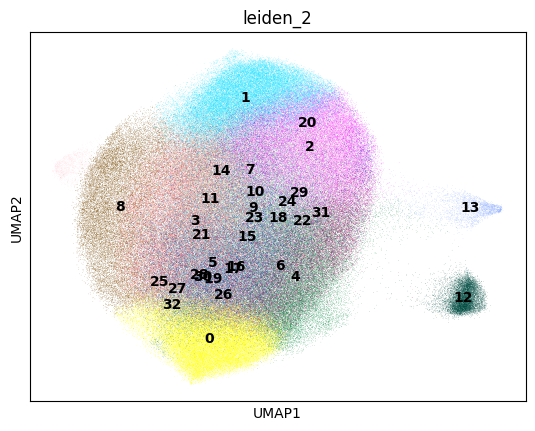

In [46]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

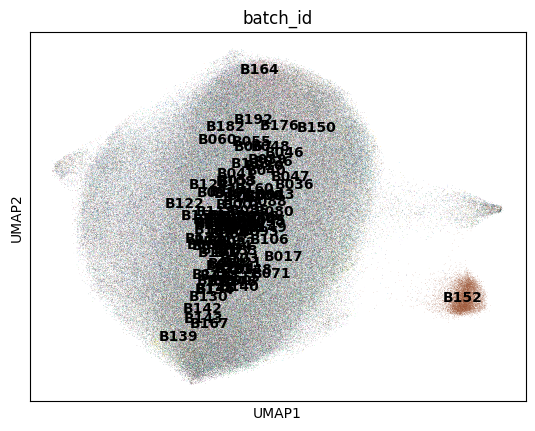

In [47]:
sc.pl.umap(adata, color = 'batch_id', legend_loc = 'on data')

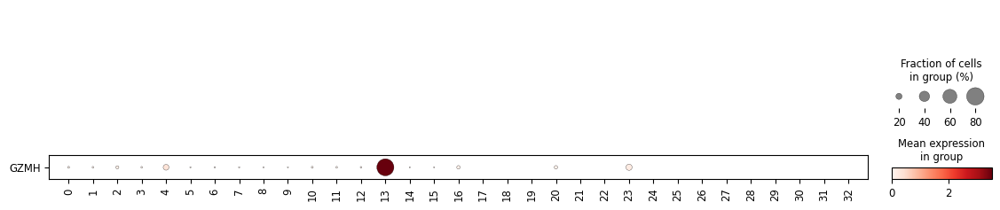

In [48]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['GZMH'], swap_axes = True)

### GZMH Selection

Filtering

In [49]:
adata, n_removed = remove_cl(
    adata, 'GZMH', 'above', 0.4, 'leiden_2'
)
n_removed

3096

Reason

In [50]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['Mislabeled GZMH+']
    }
)
update_list.append(update_df)

### Reprocess filtered and combined cells

In [51]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; 

IOStream.flush timed out


Renormalizing


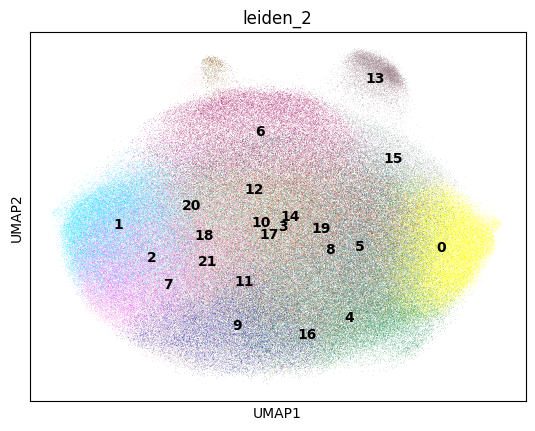

In [52]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Save filtered cells

In [53]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Filter Memory CD4 Treg

### Proposed updates

- Reassign MKI67-high cluster to Proliferating T cell

In [56]:
cell_type = 'Memory CD4 Treg'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [57]:
type_uuid

'1f156144-c524-4e2c-a19b-a617badb5066'

In [58]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [59]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

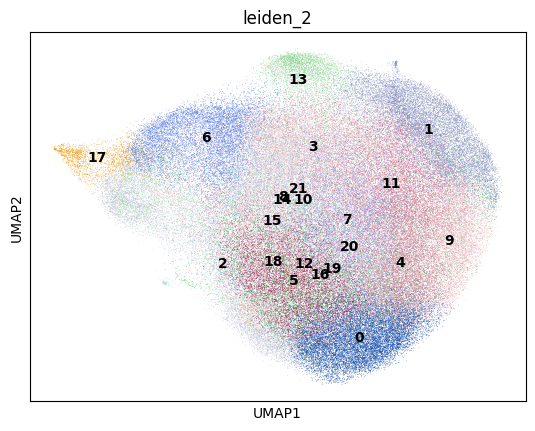

In [60]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

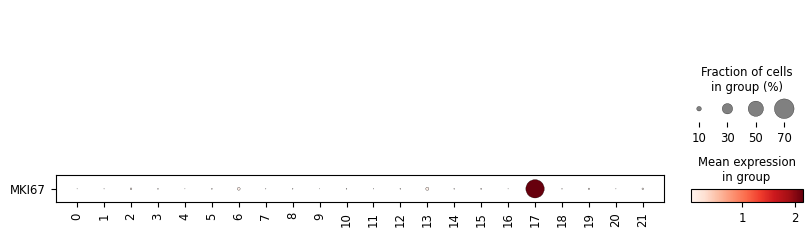

In [61]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['MKI67'], swap_axes = True)

### MKI67 selection

Extraction

In [62]:
cd4_mem_prolif_adata, n_extracted = extract_cl(
    adata, 'MKI67', 'above', 0.5, 'leiden_2'
)
cd4_mem_prolif_adata.obs['AIFI_L3'] = 'Proliferating T cell'
n_extracted

['17']


2046

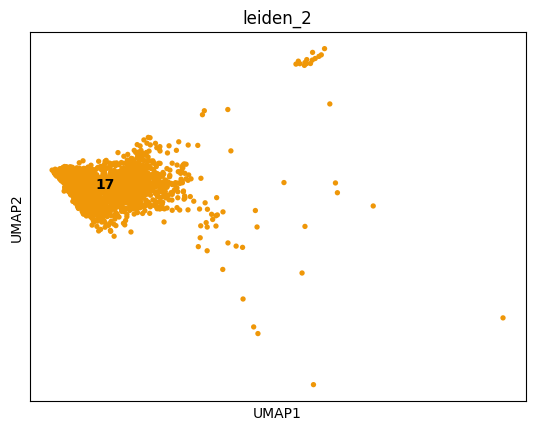

In [63]:
sc.pl.umap(cd4_mem_prolif_adata, color = 'leiden_2', legend_loc = 'on data')

Removal

In [64]:
adata, n_removed = remove_cl(
    adata, 'MKI67', 'above', 0.5, 'leiden_2'
)
n_removed

['17']


2046

Reason

In [65]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['reassign'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['Proliferating T cell']
    }
)
update_list.append(update_df)

### Reprocess filtered cells

In [66]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


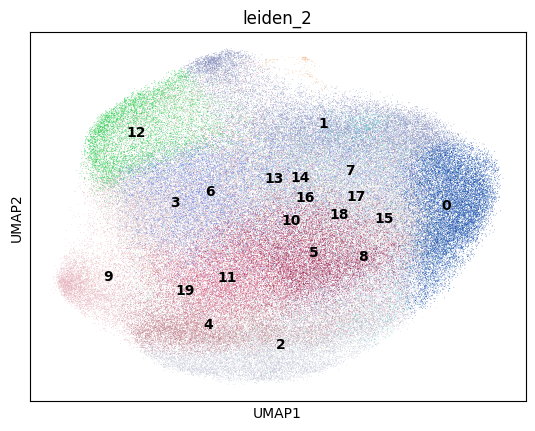

In [67]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Save filtered cells

In [68]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Filter Memory CD8 Treg

### Proposed updates

- Reassign KLRB1+ cluster (3) as KLRB1+ memory CD4 Treg

In [72]:
cell_type = 'Memory CD8 Treg'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [73]:
type_uuid

'ea9ebffc-0c0f-4ee4-b3ba-394585c5cca3'

In [74]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [75]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

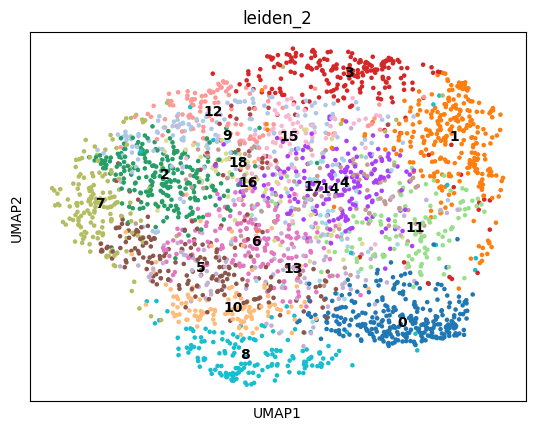

In [76]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

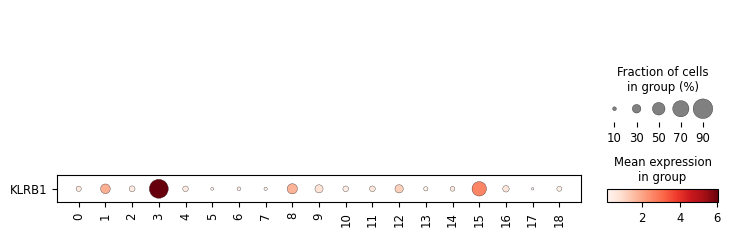

In [77]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['KLRB1'], swap_axes = True)

### KLRB1 selection

Extraction

In [78]:
cd8_mem_klrb1_adata, n_extracted = extract_cl(
    adata, 'KLRB1', 'above', 0.8, 'leiden_2'
)
cd8_mem_klrb1_adata.obs['AIFI_L3'] = 'KLRB1+ memory CD8 Treg'
n_extracted

['3']


208

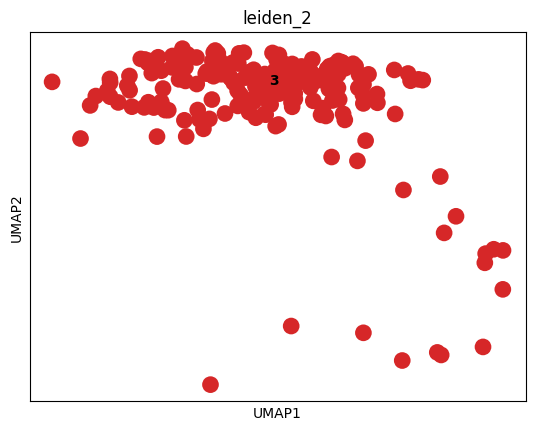

In [79]:
sc.pl.umap(cd8_mem_klrb1_adata, color = 'leiden_2', legend_loc = 'on data')

Removal

In [80]:
adata, n_removed = remove_cl(
    adata, 'KLRB1', 'above', 0.8, 'leiden_2'
)
n_removed

['3']


208

Reason

In [81]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['reassign'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['KLRB1+ memory CD8 Treg']
    }
)
update_list.append(update_df)

### Reprocess filtered cells

In [82]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


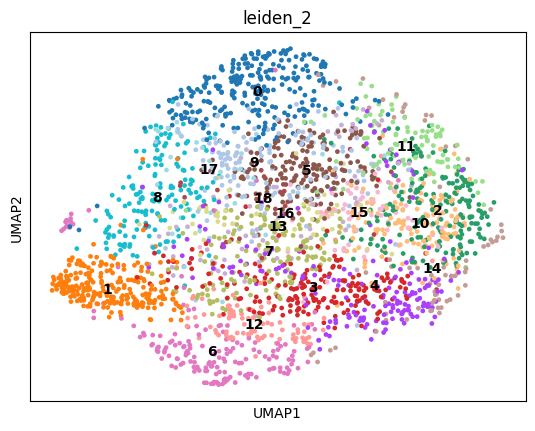

In [83]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Save filtered cells

In [84]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Filter KLRF1- effector Vd1 gdT

### Proposed updates

- Remove TRDC-low clusters (5, 19) as mislabeled
- Remove CD27+ cluster (19) as TCRab/gd doublet

In [85]:
cell_type = 'KLRF1- effector Vd1 gdT'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [86]:
type_uuid

'944d847c-1281-46ce-8d9e-512fe0a8830e'

In [87]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [88]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

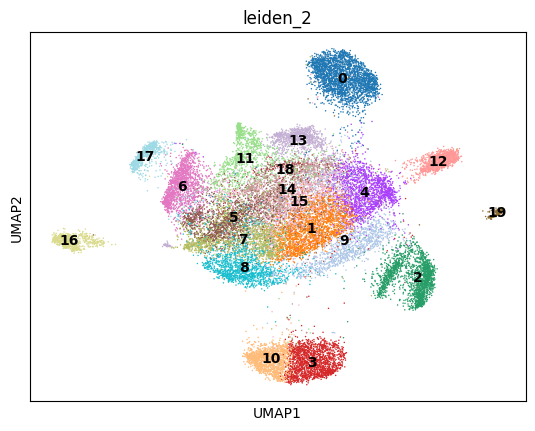

In [89]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

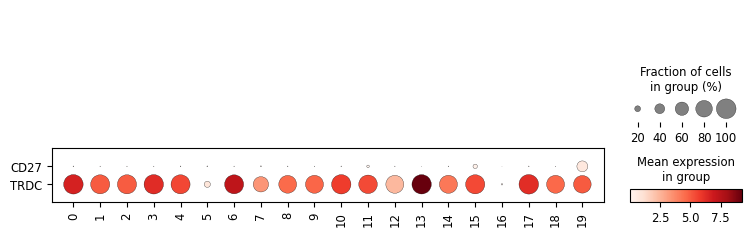

In [90]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['CD27','TRDC'], swap_axes = True)

### TRDC-low Selection

Filtering

In [91]:
adata, n_removed = remove_cl(
    adata, 'TRDC', 'below', 0.5, 'leiden_2'
)
n_removed

['5', '16']


2368

Reason

In [92]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['Mislabeled TRDC-']
    }
)
update_list.append(update_df)

### CD27 Selection

Filtering

In [93]:
adata, n_removed = remove_cl(
    adata, 'CD27', 'above', 0.4, 'leiden_2'
)
n_removed

['19']


249

Reason

In [94]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['abT/gdT doublet']
    }
)
update_list.append(update_df)

### Reprocess filtered cells

In [95]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


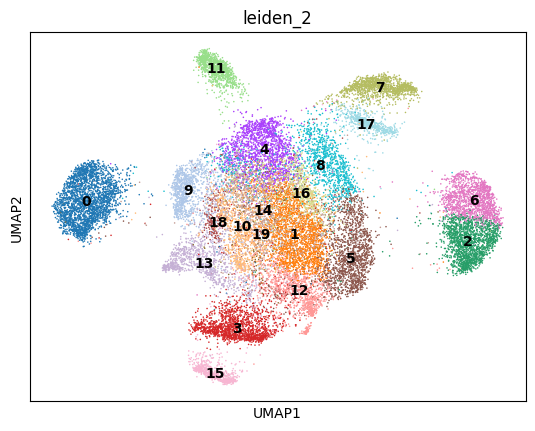

In [96]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Save filtered cells

In [97]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Filter KLRF1+ effector Vd1 gdT

### Proposed updates

- Reassign TRDV2+ cluster (20) as GZMB+ Vd2 gdT
- Remove TRDC/TRAC+ cluster (21) as ab/gd doublet

In [98]:
cell_type = 'KLRF1+ effector Vd1 gdT'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [99]:
type_uuid

'cb68fc02-5b01-47b8-9c36-d4c0269ee490'

In [100]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [101]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

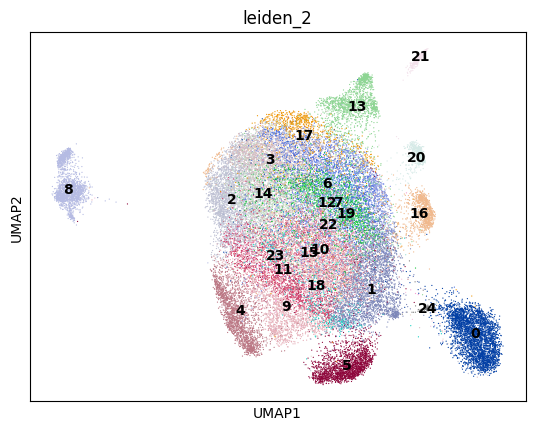

In [102]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

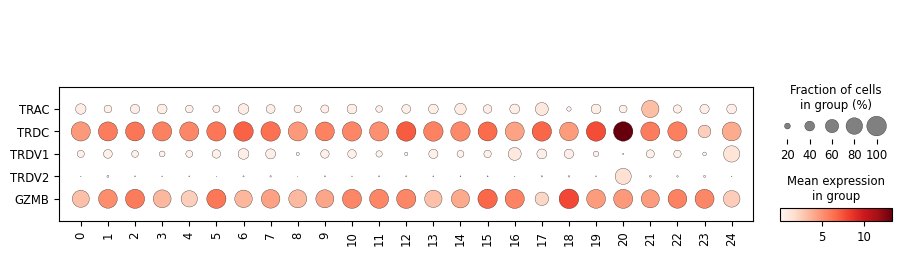

In [103]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['TRAC','TRDC','TRDV1','TRDV2','GZMB'], swap_axes = True)

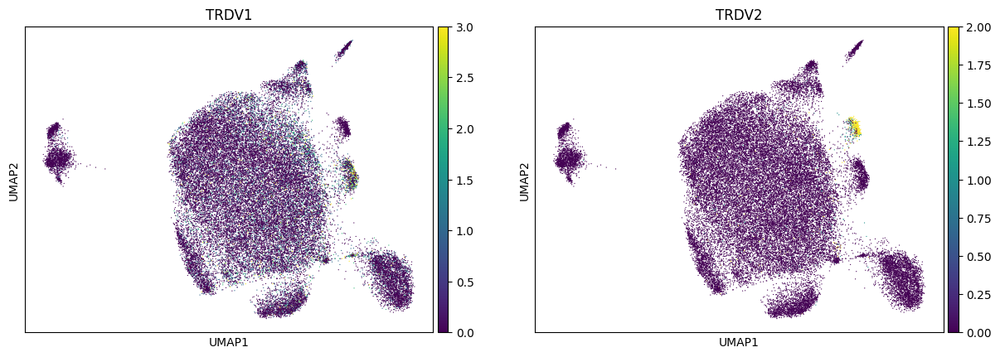

In [104]:
sc.pl.umap(adata, color = ['TRDV1', 'TRDV2'], vmax = 'p99')

### TRAC Selection

Filtering

In [105]:
adata, n_removed = remove_cl(
    adata, 'TRAC', 'above', 0.8, 'leiden_2'
)
n_removed

['21']


424

Reason

In [106]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['abT/gdT Doublet']
    }
)
update_list.append(update_df)

### TRDV2 selection

Extraction

In [107]:
klrf1_vd2_adata, n_extracted = extract_cl(
    adata, 'TRDV2', 'above', 0.6, 'leiden_2'
)
klrf1_vd2_adata.obs['AIFI_L3'] = 'GZMB+ Vd2 gdT'
n_extracted

['20']


609

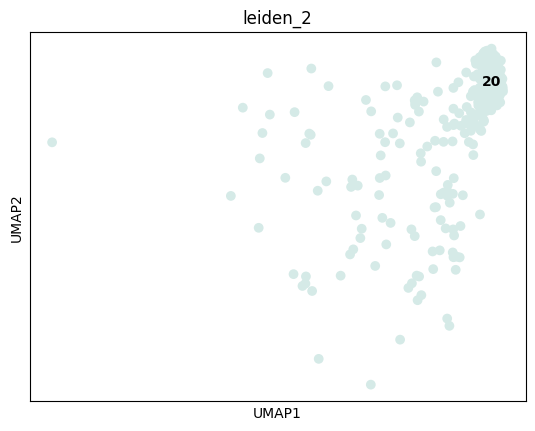

In [108]:
sc.pl.umap(klrf1_vd2_adata, color = 'leiden_2', legend_loc = 'on data')

Removal

In [109]:
adata, n_removed = remove_cl(
    adata, 'TRDV2', 'above', 0.6, 'leiden_2'
)
n_removed

['20']


609

Reason

In [110]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['reassign'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['GZMB+ Vd2 gdT']
    }
)
update_list.append(update_df)

### Reprocess filtered cells

In [111]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


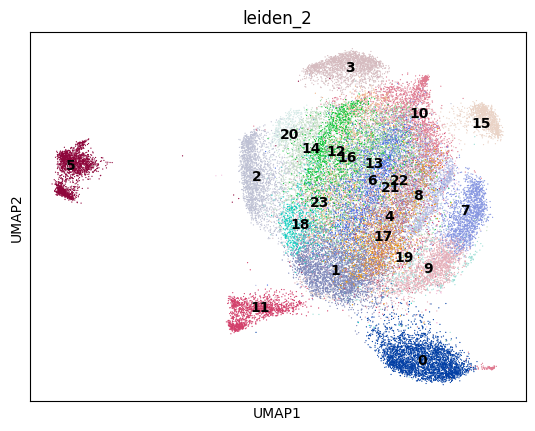

In [112]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Save filtered cells

In [113]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Review Naive Vd1 gdT

### Proposed updates

- Remove KLRB1+ cluster as Mislabeled
- Remove TRDC- cluster (8) as ab mislabeled

In [114]:
cell_type = 'Naive Vd1 gdT'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [115]:
type_uuid

'8499232d-e5fe-4292-919a-6cba21d260bd'

In [116]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [117]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

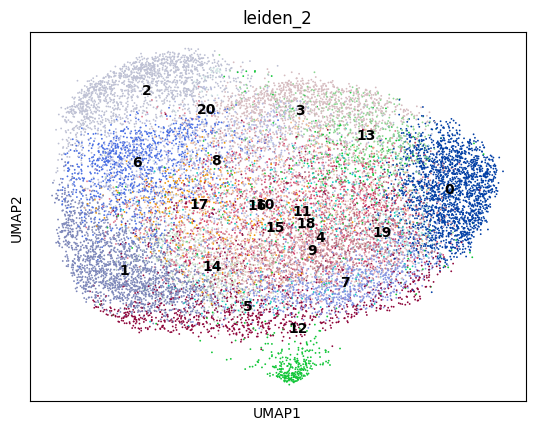

In [118]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

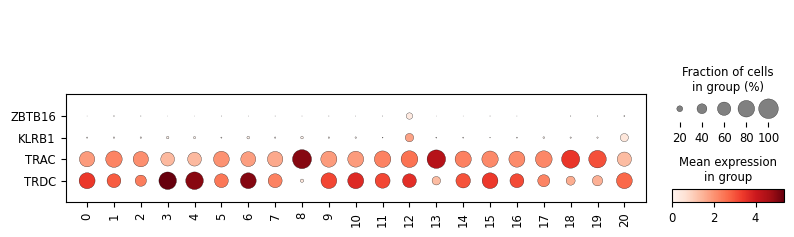

In [119]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['ZBTB16','KLRB1','TRAC','TRDC'], swap_axes = True)

### ZBTB16 Selection

Filtering

In [120]:
adata, n_removed = remove_cl(
    adata, 'ZBTB16', 'above', 0.2, 'leiden_2'
)
n_removed

['12']


579

Reason

In [121]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['Mislabeled ZBTB16+']
    }
)
update_list.append(update_df)

### TRDC- Selection

Filtering

In [122]:
adata, n_removed = remove_cl(
    adata, 'TRDC', 'below', 0.2, 'leiden_2'
)
n_removed

['8']


976

Reason

In [123]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['Mislabeled TRDC-']
    }
)
update_list.append(update_df)

### Reprocess filtered cells

In [124]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


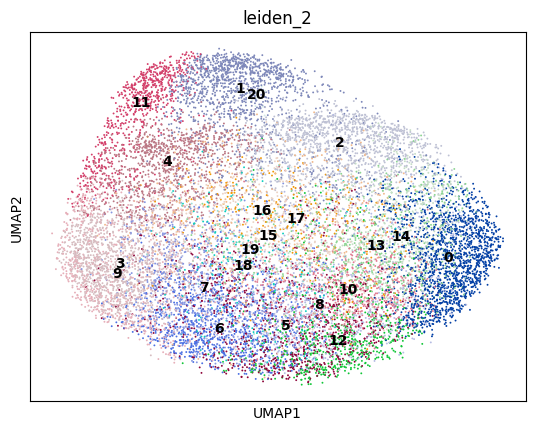

In [125]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Save filtered cells

In [126]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Review SOX4+ Vd1 gdT

### Proposed updates

- Remove KLRB1+ cluster as Mislabeled
- Remove TRDC- clusters (5 and 8) as Mislabeled
- Remove TRAC+/TRDC+ cluster (19) as ab/gd doublet

In [127]:
cell_type = 'SOX4+ Vd1 gdT'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [128]:
type_uuid

'5363c178-9783-48cd-9d74-30fec4cbc6f4'

In [129]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [130]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

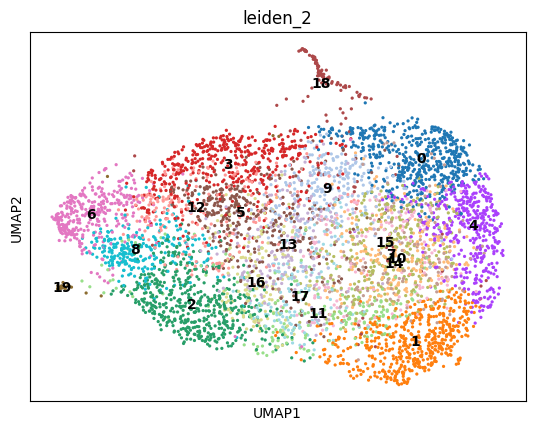

In [131]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

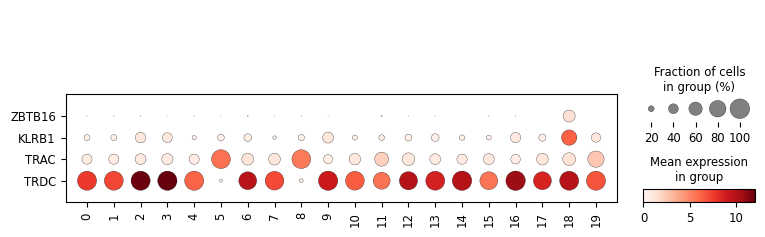

In [132]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['ZBTB16','KLRB1','TRAC','TRDC'], swap_axes = True)

### ZBTB16 Selection

Filtering

In [133]:
adata, n_removed = remove_cl(
    adata, 'ZBTB16', 'above', 0.4, 'leiden_2'
)
n_removed

['18']


135

Reason

In [134]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['Mislabeled ZBTB16+']
    }
)
update_list.append(update_df)

### TRDC- Selection

Filtering

In [135]:
adata, n_removed = remove_cl(
    adata, 'TRDC', 'below', 0.2, 'leiden_2'
)
n_removed

['5', '8']


601

Reason

In [136]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['Mislabeled TRDC-']
    }
)
update_list.append(update_df)

### TRAC Selection

Filtering

In [137]:
adata, n_removed = remove_cl(
    adata, 'TRAC', 'above', 0.75, 'leiden_2'
)
n_removed

['19']


27

Reason

In [138]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['Mislabeled TRAC+']
    }
)
update_list.append(update_df)

### Reprocess filtered cells

In [139]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


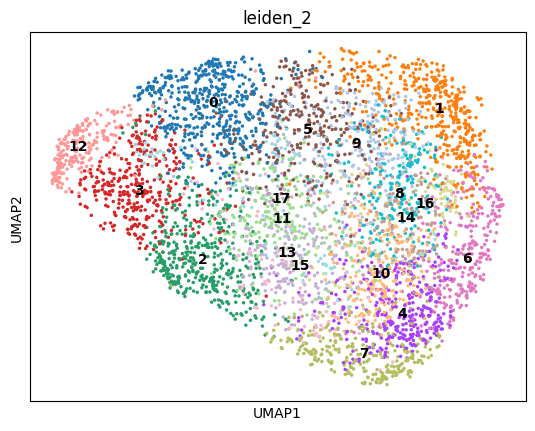

In [140]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Save filtered cells

In [141]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Review GZMK+ Vd2 gdT

### Proposed updates

- Remove CD8A+ and CD4+ clusters (15 and 17) as doublets
- Remove Doublet score-high cluster (6) as doublets

In [142]:
cell_type = 'GZMK+ Vd2 gdT'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [143]:
type_uuid

'bd5f74a9-8269-4fdd-b59e-6231133e10ab'

In [144]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [145]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

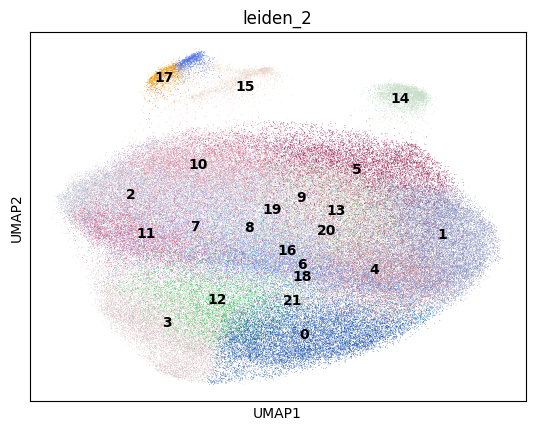

In [146]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

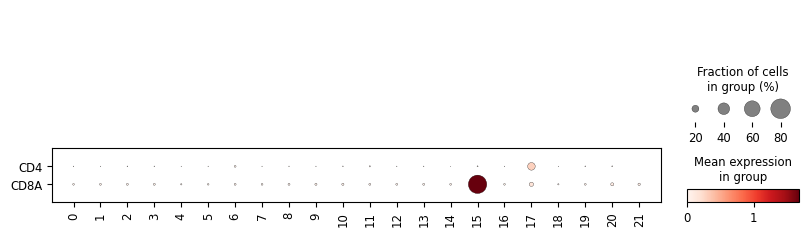

In [147]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['CD4','CD8A'], swap_axes = True)

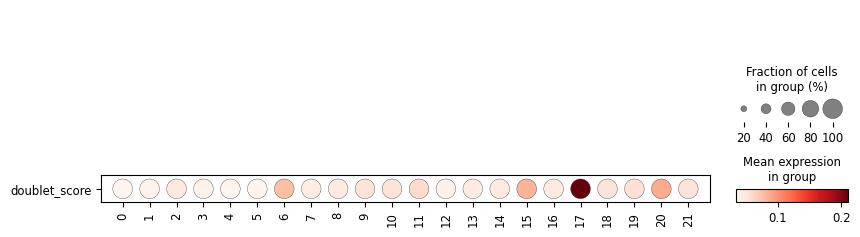

In [148]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['doublet_score'], swap_axes = True)

### CD4 Selection

Filtering

In [149]:
adata, n_removed = remove_cl(
    adata, 'CD4', 'above', 0.2, 'leiden_2'
)
n_removed

['17']


1401

Reason

In [150]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['CD4 Doublet']
    }
)
update_list.append(update_df)

### High doublet score selection

In [151]:
cl_mean_doublet_score = sc.pl.dotplot(
        adata, groupby = 'leiden_2',
        var_names = 'doublet_score',
        return_fig = True
    ).dot_color_df
select_cl = cl_mean_doublet_score.index[cl_mean_doublet_score['doublet_score'] > 0.07].tolist()
select_cl

['6', '15', '20']

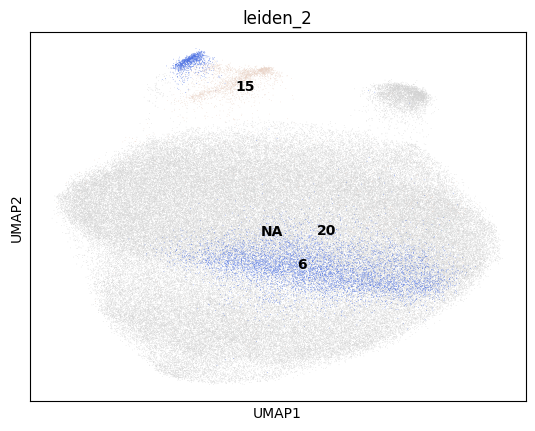

In [152]:
sc.pl.umap(adata, color = 'leiden_2', groups = select_cl, legend_loc = 'on data')

### High doublet score filtering

In [153]:
remove_idx = adata.obs['leiden_2'].isin(select_cl)
n_removed = sum(remove_idx)
keep_idx = [not x for x in remove_idx]
adata = adata[keep_idx]

In [154]:
n_removed

11261

### High doublet score reason

In [155]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['reassign'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['Doublets']
    }
)
update_list.append(update_df)

### Reprocess filtered cells

In [156]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


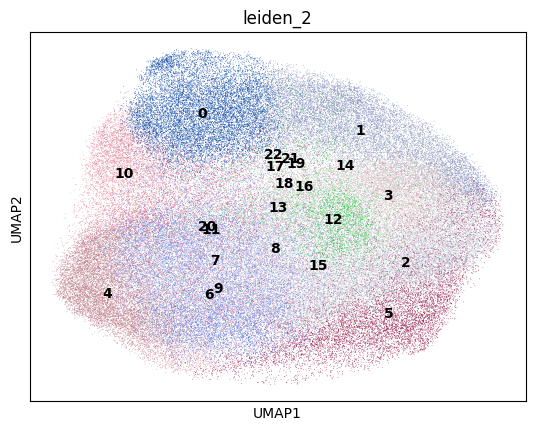

In [157]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Save filtered cells

In [158]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Filter KLRB1+ memory CD8 Treg

### Proposed updates

- Remove GNLY-high cluster as mislabeled
- Remove PPBP-high cluster as Platelet doublets

In [159]:
cell_type = 'KLRB1+ memory CD8 Treg'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [160]:
type_uuid

'7eda2fb3-9de4-46bd-b2c8-c5064f1d4817'

In [161]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [162]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

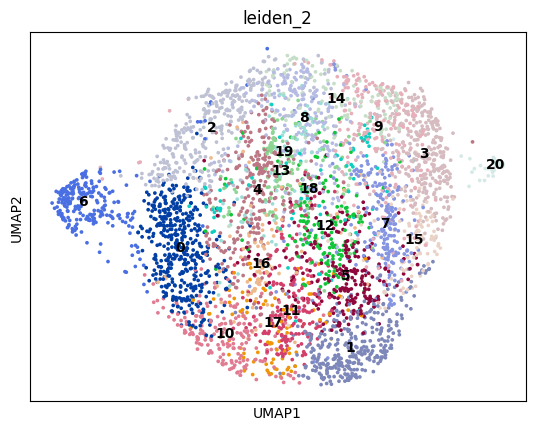

In [163]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

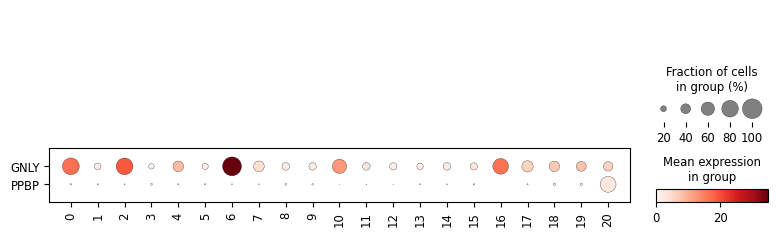

In [164]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['GNLY','PPBP'], swap_axes = True)

### GNLY Selection

Filtering

In [165]:
adata, n_removed = remove_cl(
    adata, 'GNLY', 'above', 0.9, 'leiden_2'
)
n_removed

['6']


249

Reason

In [166]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['Mislabeled GNLY+']
    }
)
update_list.append(update_df)

### PPBP Selection

Filtering

In [167]:
adata, n_removed = remove_cl(
    adata, 'PPBP', 'above', 0.6, 'leiden_2'
)
n_removed

['20']


48

Reason

In [168]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['Platelet doublet']
    }
)
update_list.append(update_df)

### Reprocess filtered cells

In [169]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


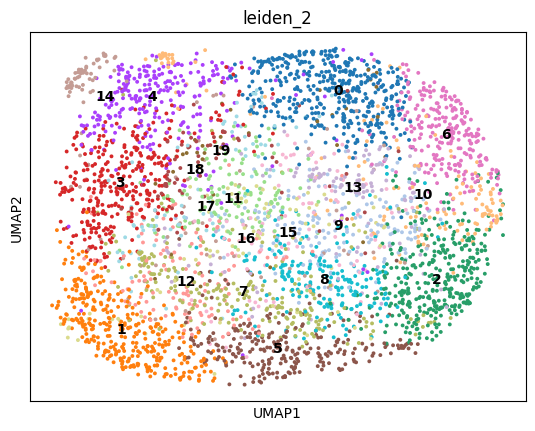

In [170]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

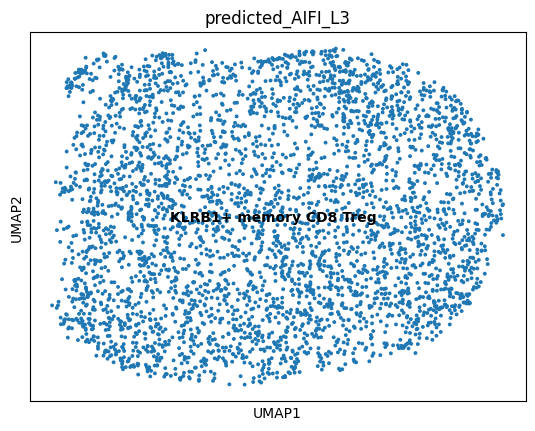

In [171]:
sc.pl.umap(adata, color = 'predicted_AIFI_L3', legend_loc = 'on data')

### Save filtered cells

In [173]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

# Reassignment/Integration

## Filter KLRB1+ memory CD4 Treg

### Proposed updates

- Reassign GZMK-high cluster (10) as GZMK+ memory CD4 Treg
- Remove CCL5-high cluster (18) as mislabeled
- Integrate KLRB1+ cells from Memory CD8 Tregs

In [189]:
cell_type = 'KLRB1+ memory CD4 Treg'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [190]:
type_uuid

'b8234e80-375e-4101-a009-e47711a2fbbf'

In [191]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [192]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

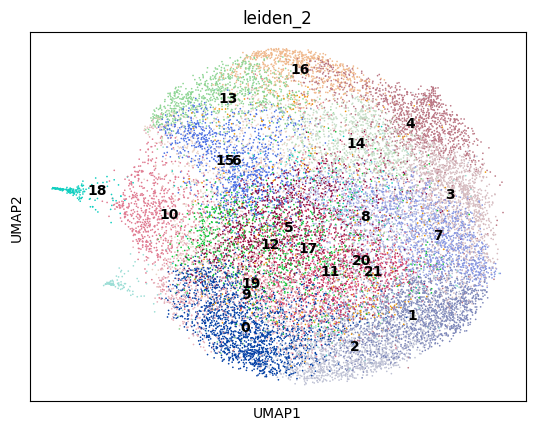

In [193]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

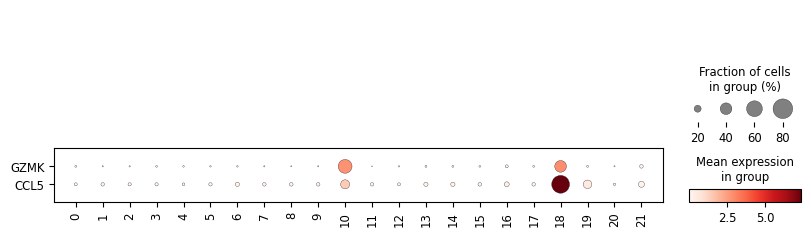

In [194]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['GZMK','CCL5'], swap_axes = True)

### CCL5 Filtering

In [195]:
adata, n_removed = remove_cl(
    adata, 'CCL5', 'above', 0.6, 'leiden_2'
)
n_removed

['18']


275

### CCL5 Reason

In [196]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['Mislabeled CCL5+']
    }
)
update_list.append(update_df)

### GZMK selection

In [197]:
klrb1_gzmk_adata, n_extracted = extract_cl(
    adata, 'GZMK', 'above', 0.4, 'leiden_2'
)
klrb1_gzmk_adata.obs['AIFI_L3'] = 'GZMK+ memory CD4 Treg'
n_extracted

['10']


1061

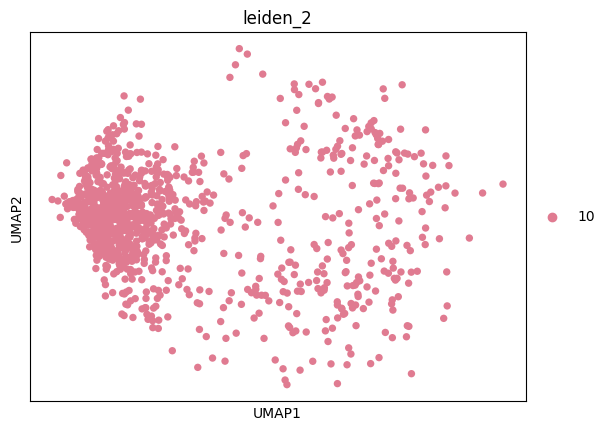

In [198]:
sc.pl.umap(klrb1_gzmk_adata, color = 'leiden_2')

### GZMK Filtering

In [199]:
adata, n_removed = remove_cl(
    adata, 'GZMK', 'above', 0.4, 'leiden_2'
)
n_removed

['10']


1061

### GZMK Reason

In [200]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['reassign'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['GZMK+ memory CD4 Treg']
    }
)
update_list.append(update_df)

### Integrate KLRB1+ cells from CD8 Tregs

In [201]:
adata = sc.concat([adata, cd8_mem_klrb1_adata])

### Reprocess filtered cells

In [202]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


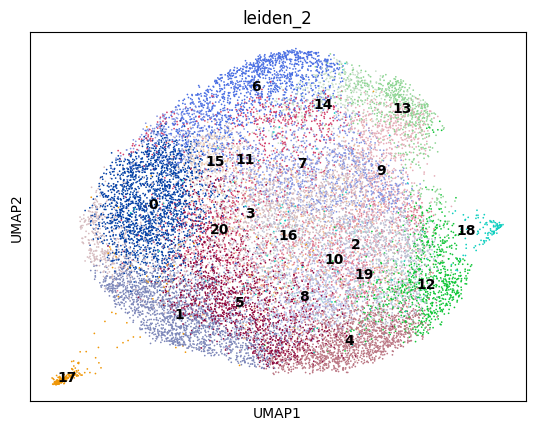

In [203]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

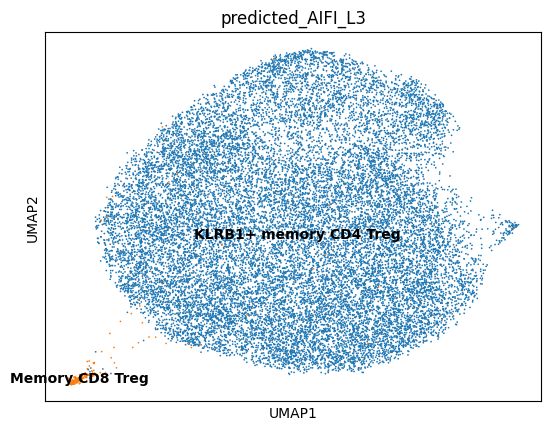

In [204]:
sc.pl.umap(adata, color = 'predicted_AIFI_L3', legend_loc = 'on data')

### Save filtered cells

In [205]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Integrate GZMB+ Vd2 gdT

### Proposed updates

- Integrate GZMB+ Vd2 gdT from Naive Vd1 gdT

In [206]:
cell_type = 'GZMB+ Vd2 gdT'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [207]:
type_uuid

'75152e09-ada0-47f3-bfe4-eddf1475815f'

In [208]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [209]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

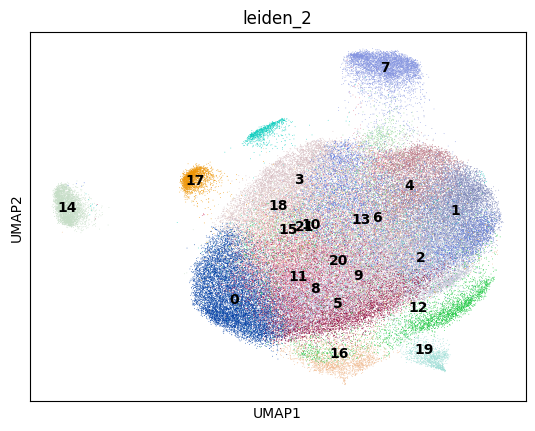

In [210]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Combine cells from filtered groups

In [211]:
adata = sc.concat([adata, klrf1_vd2_adata])

### Reprocess filtered and combined cells

In [212]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


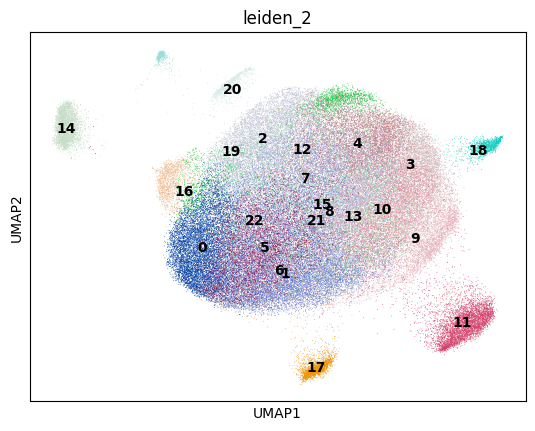

In [213]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

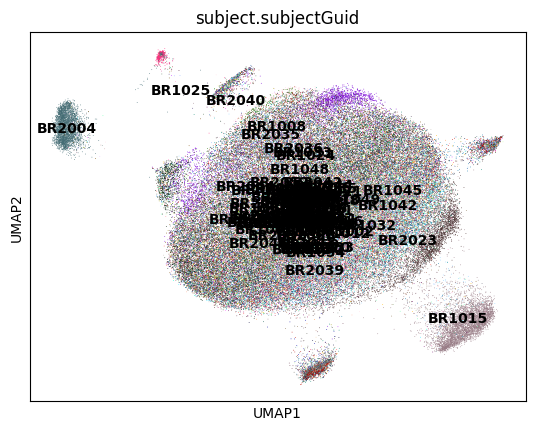

In [214]:
sc.pl.umap(adata, color = 'subject.subjectGuid', legend_loc = 'on data')

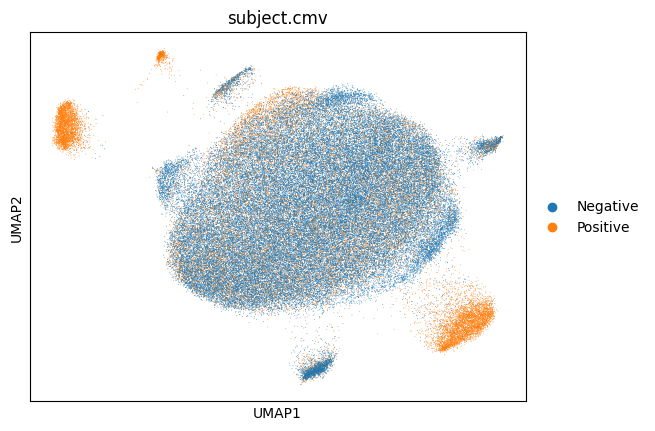

In [215]:
sc.pl.umap(adata, color = 'subject.cmv')

### Save filtered cells

In [217]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Review GZMK+ memory CD4 Treg

### Proposed updates

Integrate GZMK+ cells from KLRB1+ memory CD4 Treg

In [218]:
cell_type = 'GZMK+ memory CD4 Treg'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [219]:
type_uuid

'ae391fc0-16df-4bbe-86a1-55e6aefe79d5'

In [220]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [221]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

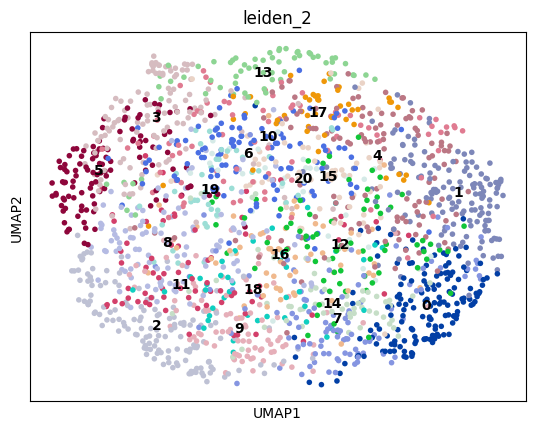

In [222]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Combine cells from filtered groups

In [223]:
adata = sc.concat([adata, klrb1_gzmk_adata])

### Reprocess filtered and combined cells

In [224]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


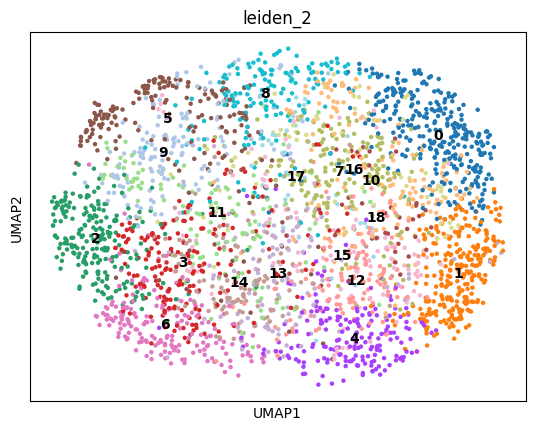

In [225]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

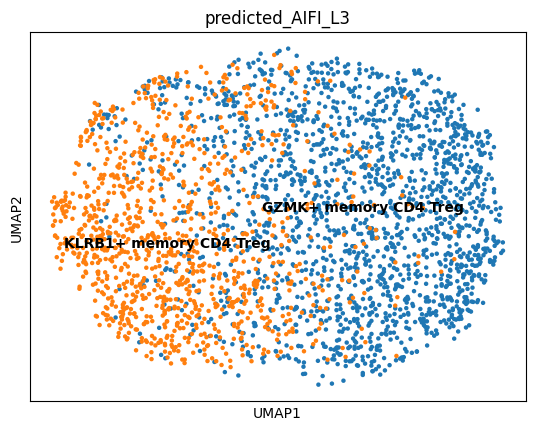

In [227]:
sc.pl.umap(adata, color = 'predicted_AIFI_L3', legend_loc = 'on data')

### Save filtered cells

In [229]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Review Proliferating T cell

### Proposed updates

- Remove CD3D- clusters (22 and 27) as Non-T
- Integrate proliferating Tregs

In [230]:
cell_type = 'Proliferating T cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [231]:
type_uuid

'b3b66ced-cfcb-4b15-9edb-faffe931efd9'

In [232]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [233]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

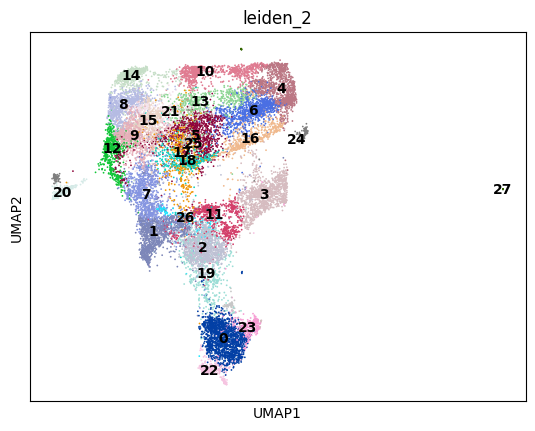

In [234]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

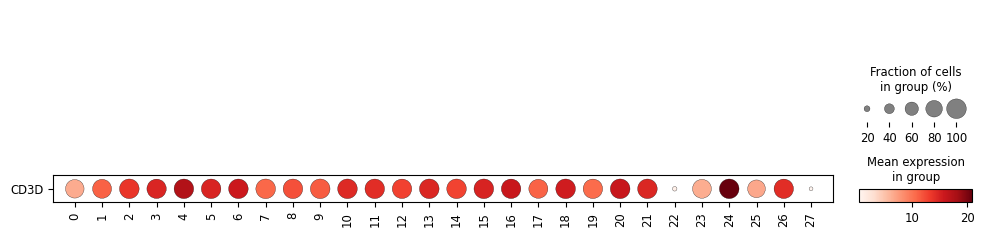

In [235]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['CD3D'], swap_axes = True)

### CD3D- Selection

In [236]:
cd3d_neg_cl = select_clusters_below_gene_frac(
    adata, 'CD3D', 0.8, 'leiden_2'
)
cd3d_neg_cl

['22', '27']

In [237]:
sel_adata = adata[adata.obs['leiden_2'].isin(cd3d_neg_cl)]
sel_adata.shape

(388, 33538)

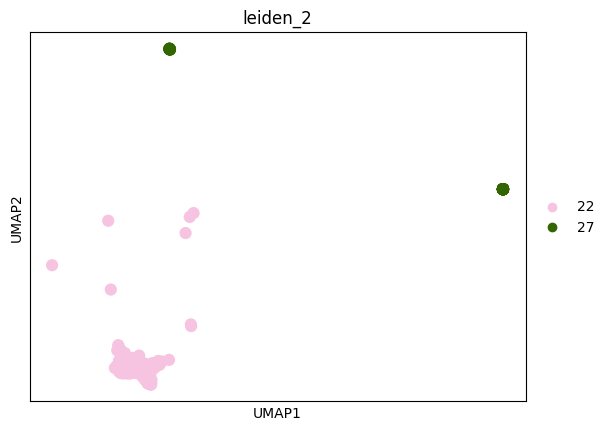

In [238]:
sc.pl.umap(sel_adata, color = 'leiden_2')

### CD3D- Filtering

In [239]:
filter_idx = [not x for x in adata.obs['leiden_2'].isin(cd3d_neg_cl)]
adata = adata[filter_idx]

### CD3D- Reason

In [240]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [sel_adata.shape[0]],
     'change_to': ['Mislabeled CD3D-']
    }
)
update_list.append(update_df)

### Combine cells from filtered groups

In [241]:
adata = sc.concat([adata, cd4_mem_prolif_adata])

### Reprocess filtered and combined cells

In [242]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


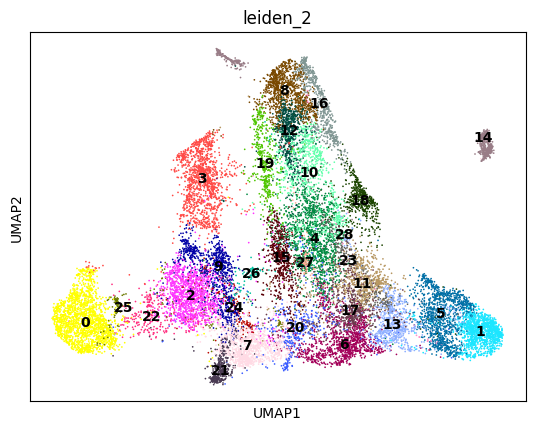

In [243]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

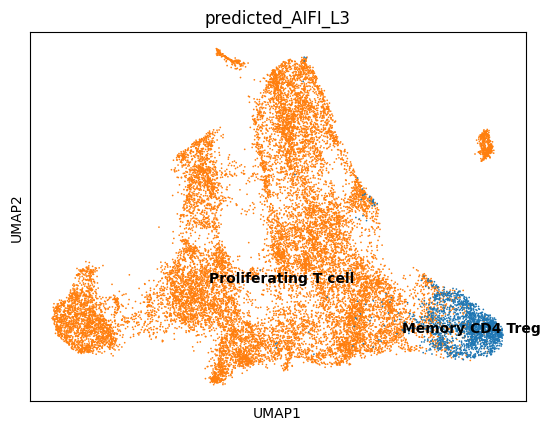

In [244]:
sc.pl.umap(adata, color = 'predicted_AIFI_L3', legend_loc = 'on data')

### Save filtered cells

In [246]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

# No Updates

## Review ISG+ MAIT

### Proposed updates

No proposed changes

In [247]:
cell_type = 'ISG+ MAIT'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [248]:
type_uuid

'7a17a651-8936-4801-99cc-1e0101e1163f'

In [249]:
adata = read_adata_uuid(type_uuid)
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']
adata = propagate_hierarchy(adata, hierarchy_df)

In [250]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Review DN T cell

### Proposed updates

No proposed changes

In [251]:
cell_type = 'DN T cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [252]:
type_uuid

'ff91c063-1ed7-43c5-9aed-eb9850d83905'

In [253]:
adata = read_adata_uuid(type_uuid)
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']
adata = propagate_hierarchy(adata, hierarchy_df)

In [254]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Assemble update reasoning

In [255]:
update_df = pd.concat(update_list)

In [256]:
update_df

,AIFI_L3,update_type,n_total,n_updated,change_to
0,CD4 MAIT,reassign,13218,6372,Doublets
0,CD8 MAIT,remove,343976,3096,Mislabeled GZMH+
0,Memory CD4 Treg,reassign,144667,2046,Proliferating T cell
0,Memory CD8 Treg,reassign,2781,208,KLRB1+ memory CD8 Treg
0,KLRF1- effector Vd1 gdT,remove,26387,2368,Mislabeled TRDC-
0,KLRF1- effector Vd1 gdT,remove,26387,249,abT/gdT doublet
0,KLRF1+ effector Vd1 gdT,remove,38503,424,abT/gdT Doublet
0,KLRF1+ effector Vd1 gdT,reassign,38503,609,GZMB+ Vd2 gdT
0,Naive Vd1 gdT,remove,17602,579,Mislabeled ZBTB16+
0,Naive Vd1 gdT,remove,17602,976,Mislabeled TRDC-


In [257]:
out_update = 'output/diha_filtered_celltypist_L3_other_t_reasons_{d}.csv'.format(d = date.today())
update_df.to_csv(out_update)
out_files.append(out_update)

## Upload Cell Type data to HISE

Finally, we'll use `hisepy.upload.upload_files()` to send a copy of our output to HISE to use for downstream analysis steps.

In [258]:
study_space_uuid = 'de025812-5e73-4b3c-9c3b-6d0eac412f2a'
title = 'DIHA CellTypist L3 Other T Filtered {d}'.format(d = date.today())

In [259]:
search_id = element_id()
search_id

'darmstadtium-silver-erbium'

In [260]:
in_files = search_df['id'].tolist()
in_files = in_files + [hierarchy_uuid]

In [265]:
out_files

['output/diha_filtered_celltypist_L3_SOX4pos_Vd1_gdT_2024-04-18.h5ad',
 'output/diha_filtered_celltypist_L3_Naive_Vd1_gdT_2024-04-18.h5ad',
 'output/diha_filtered_celltypist_L3_CD4_MAIT_2024-04-18.h5ad',
 'output/diha_filtered_celltypist_L3_GZMKpos_Vd2_gdT_2024-04-18.h5ad',
 'output/diha_filtered_celltypist_L3_KLRB1pos_memory_CD4_Treg_2024-04-18.h5ad',
 'output/diha_filtered_celltypist_L3_CD8_MAIT_2024-04-18.h5ad',
 'output/diha_filtered_celltypist_L3_GZMBpos_Vd2_gdT_2024-04-18.h5ad',
 'output/diha_filtered_celltypist_L3_Proliferating_T_cell_2024-04-18.h5ad',
 'output/diha_filtered_celltypist_L3_GZMKpos_memory_CD4_Treg_2024-04-18.h5ad',
 'output/diha_filtered_celltypist_L3_DN_T_cell_2024-04-18.h5ad',
 'output/diha_filtered_celltypist_L3_Memory_CD4_Treg_2024-04-18.h5ad',
 'output/diha_filtered_celltypist_L3_ISGpos_MAIT_2024-04-18.h5ad',
 'output/diha_filtered_celltypist_L3_Mono_DC_reasons_2024-04-18.csv',
 'output/diha_filtered_celltypist_L3_KLRB1pos_memory_CD8_Treg_2024-04-18.h5ad',
 '

In [266]:
hisepy.upload.upload_files(
    files = out_files,
    study_space_id = study_space_uuid,
    title = title,
    input_file_ids = in_files,
    destination = search_id
)

you are trying to upload file_ids... ['output/diha_filtered_celltypist_L3_SOX4pos_Vd1_gdT_2024-04-18.h5ad', 'output/diha_filtered_celltypist_L3_Naive_Vd1_gdT_2024-04-18.h5ad', 'output/diha_filtered_celltypist_L3_CD4_MAIT_2024-04-18.h5ad', 'output/diha_filtered_celltypist_L3_GZMKpos_Vd2_gdT_2024-04-18.h5ad', 'output/diha_filtered_celltypist_L3_KLRB1pos_memory_CD4_Treg_2024-04-18.h5ad', 'output/diha_filtered_celltypist_L3_CD8_MAIT_2024-04-18.h5ad', 'output/diha_filtered_celltypist_L3_GZMBpos_Vd2_gdT_2024-04-18.h5ad', 'output/diha_filtered_celltypist_L3_Proliferating_T_cell_2024-04-18.h5ad', 'output/diha_filtered_celltypist_L3_GZMKpos_memory_CD4_Treg_2024-04-18.h5ad', 'output/diha_filtered_celltypist_L3_DN_T_cell_2024-04-18.h5ad', 'output/diha_filtered_celltypist_L3_Memory_CD4_Treg_2024-04-18.h5ad', 'output/diha_filtered_celltypist_L3_ISGpos_MAIT_2024-04-18.h5ad', 'output/diha_filtered_celltypist_L3_Mono_DC_reasons_2024-04-18.csv', 'output/diha_filtered_celltypist_L3_KLRB1pos_memory_CD8_T

(y/n) y


{'trace_id': '501e0fe6-02b7-425e-b322-280bc6b6731a',
 'files': ['output/diha_filtered_celltypist_L3_SOX4pos_Vd1_gdT_2024-04-18.h5ad',
  'output/diha_filtered_celltypist_L3_Naive_Vd1_gdT_2024-04-18.h5ad',
  'output/diha_filtered_celltypist_L3_CD4_MAIT_2024-04-18.h5ad',
  'output/diha_filtered_celltypist_L3_GZMKpos_Vd2_gdT_2024-04-18.h5ad',
  'output/diha_filtered_celltypist_L3_KLRB1pos_memory_CD4_Treg_2024-04-18.h5ad',
  'output/diha_filtered_celltypist_L3_CD8_MAIT_2024-04-18.h5ad',
  'output/diha_filtered_celltypist_L3_GZMBpos_Vd2_gdT_2024-04-18.h5ad',
  'output/diha_filtered_celltypist_L3_Proliferating_T_cell_2024-04-18.h5ad',
  'output/diha_filtered_celltypist_L3_GZMKpos_memory_CD4_Treg_2024-04-18.h5ad',
  'output/diha_filtered_celltypist_L3_DN_T_cell_2024-04-18.h5ad',
  'output/diha_filtered_celltypist_L3_Memory_CD4_Treg_2024-04-18.h5ad',
  'output/diha_filtered_celltypist_L3_ISGpos_MAIT_2024-04-18.h5ad',
  'output/diha_filtered_celltypist_L3_Mono_DC_reasons_2024-04-18.csv',
  'outp

In [267]:
import session_info
session_info.show()